# INF0413 - Processamento Digital de Sinais e Imagens

A01 - Primeira avaliação da aprendizagem

**Lecturer / Examiner**:

- Aldo Díaz (aldo.diaz@ufg.br)

**Teaching Assistants:**

- Lucca Emmanuel Pinelli Simões (lucca.pineli@discente.ufg.br)

- Gabriel Van Der Schmidt (gabriel_schmidt@discente.ufg.br)

- Lucas Simões Passos (lucas.simoes@discente.ufg.br)

## Introdução

O processamento de áudio desempenha um papel fundamental na área da Inteligência Artificial, possibilitando uma variedade de aplicações essenciais em nosso mundo digital. A capacidade de extrair informações significativas a partir de sinais sonoros não apenas amplia nosso entendimento do ambiente, mas também oferece inúmeras oportunidades para melhorar a qualidade de vida e explorar novos horizontes tecnológicos.

Hoje iremos investigar uma aplicação interessante desta área de conhecimento para o esporte, o **pulo de corda**, uma atividade física que combina diversão e saúde. Neste desafio, vamos explorar como o processamento de áudio pode auxiliar na forma como atletas praticam este esporte.

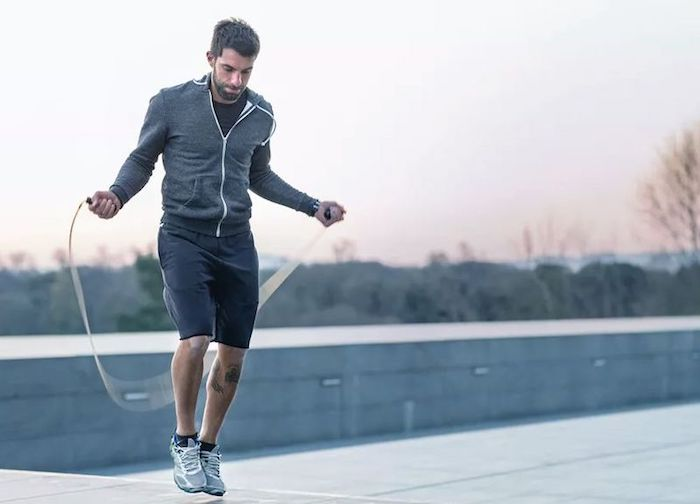

## O desafio
Um contador automático de pulos de corda seria de muita utilidade para os entusiastas deste esporte, tornando suas experiências mais envolventes e produtivas. Além de eliminar a margem de erro associada à contagem manual, ele ofereceria um acompanhamento preciso do desempenho, permitindo que os praticantes ajustem suas rotinas de treinamento com base em dados confiáveis. Isso não apenas melhora a eficácia dos exercícios, mas também pode servir como uma ferramenta motivacional, permitindo que os atletas estabeleçam metas e meçam seu progresso de forma consistente. Em competições, o contador automático garante uma avaliação justa e imparcial, nivelando o campo de jogo para todos os participantes.

Nesta prova, nosso objetivo será criar um detector de pulo de corda e não um contador. O foco será desenvolver um modelo que, dado um determinado áudio, determine se alguém está pulando corda ou não. Isso é um passo fundamental, pois antes de realizar a contagem automatizada, é essencial identificar a presença do movimento de pulo de corda. Este desafio marca o início do processo, preparando o caminho para a automatização completa da contagem.




## Os dados

Os dados foram coletados pelo Lucca. São disponibilizadas três gravações nas quais são realizados saltos de corda a diferentes distâncias dos fones de gravação. Os dados não passaram por nenhum processamento específico, no entanto, foram editados de forma a garantir que cada áudio tenha um tamanho fixo de 1 milhão de amostras, com uma frequência de amostragem de 48000, resultando em uma duração de 20.8 segundos. Além disso, os áudios foram segmentados de modo que a primeira metade não contenha a prática de pular corda, enquanto na segunda metade os saltos sejam efetivamente exeutados. Para resumir:

- 3 áudios
- 1 milhão de tamanho
- 48000 de frequência de amostragem
- 20.8 segundos de audio
- Primeira metade não estou pulando, segunda metade estou pulando

In [40]:
# Baixar o dataset
!gdown 1-BfjhuHYpFXYZDkvD81aoahNkn2VJjve # sinal x1
!gdown 1-ETBKzy9_ZgkH2_jX9e2-e1vaiaQwiCf # sinal x2
!gdown 1-FFx3jox6GGNyU0qb8vwk_ztSKW67nK1 # sinal x3
!gdown 185wKkiCKNBDN4BxBAqmXVYr0OD59E4JQ # myAudioProcessing

Downloading...
From: https://drive.google.com/uc?id=1-BfjhuHYpFXYZDkvD81aoahNkn2VJjve
To: /content/x1.npz
100% 8.00M/8.00M [00:00<00:00, 93.3MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-ETBKzy9_ZgkH2_jX9e2-e1vaiaQwiCf
To: /content/x2.npz
100% 8.00M/8.00M [00:00<00:00, 160MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-FFx3jox6GGNyU0qb8vwk_ztSKW67nK1
To: /content/x3.npz
100% 8.00M/8.00M [00:00<00:00, 185MB/s]
Downloading...
From: https://drive.google.com/uc?id=185wKkiCKNBDN4BxBAqmXVYr0OD59E4JQ
To: /content/myAudioProcessingLib.py
100% 1.22k/1.22k [00:00<00:00, 3.73MB/s]


In [41]:
import numpy as np
import matplotlib.pyplot as plt
import sys
sys.path.append('/content/')
from myAudioProcessingLib import *

# Iremos importar os dados como numpy arrays
x1 = np.load('/content/x1.npz')['arr_0']
x2 = np.load('/content/x2.npz')['arr_0']
x3 = np.load('/content/x3.npz')['arr_0']

# fs é nossa frequência de amostragem
# Neste caso, coletamos 48000 amostras por segundo
fs = 48000

## Visualizando os dados

Vamos dar início a nossa exploração de dados!

Mas antes, vamos criar uma função que será útil para visualização dos plots.

In [42]:
def plot_2_figures(figure1, figure2, **kwargs):
    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2)

    # Plot the first figure in the first subplot
    ax1.plot(figure1)
    ax1.set_title(kwargs.get('title1', 'Subplot 1'))
    ax1.set_xlabel(kwargs.get('xlegend1', 'X-axis'))
    ax1.set_ylabel(kwargs.get('ylegend1', 'Y-axis'))

    # Plot the second figure in the second subplot
    ax2.plot(figure2)
    ax2.set_title(kwargs.get('title2', 'Subplot 2'))
    ax2.set_xlabel(kwargs.get('xlegend2', 'X-axis'))
    ax2.set_ylabel(kwargs.get('ylegend2', 'Y-axis'))

    # Display the plot
    plt.show()

Além disso, vamos definir uns parametros para que os plots fiquem mais bonitos e personalizados.

In [43]:
'''
Este código só define algumas características dos plots que iremos fazer
para ficar mais bonito e com o código mais limpo
'''
from warnings import simplefilter

simplefilter('ignore')

# Set Matplotlib defaults
plt.style.use('seaborn-whitegrid')
plt.rc('figure', autolayout=True, figsize=(12, 4))
plt.rc(
    'axes',
    labelweight='bold',
    labelsize='large',
    titleweight='bold',
    titlesize=16,
    titlepad=10,
)

%config InlineBackend.figure_format = 'retina'

Aqui um exemplo de como usar a função:

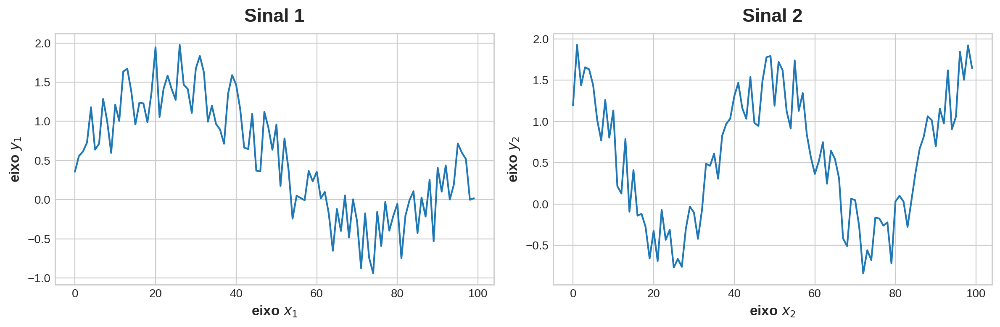

In [44]:
N = 100 # amostras
n = np.linspace(0, 2*np.pi, N)

sinal1 = np.sin(n) + np.random.random(N)
sinal2 = np.cos(2*n) + np.random.random(N)

kwargs = {
    'title1': 'Sinal 1',
    'xlegend1': r'eixo $x_1$',
    'ylegend1': r'eixo $y_1$',
    'title2': 'Sinal 2',
    'xlegend2': r'eixo $x_2$',
    'ylegend2': r'eixo $y_2$'
}

plot_2_figures(sinal1, sinal2, **kwargs)


Vamos "ver" como é a cara de nossos áudios?

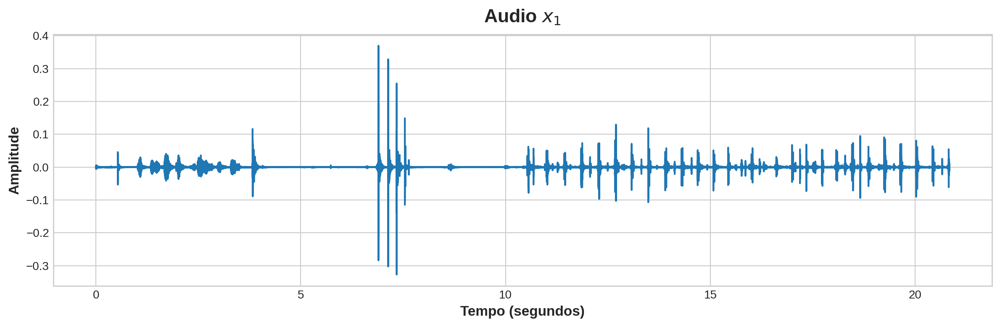

In [45]:
# Criando o vetor de tempo
N1 = len(x1)
n = np.arange(N1)
t = n / fs

# Plotagem do sinal de audio
plt.plot(t, x1)
plt.title(r'Audio $x_1$')
plt.xlabel('Tempo (segundos)')
plt.ylabel('Amplitude')
plt.show()

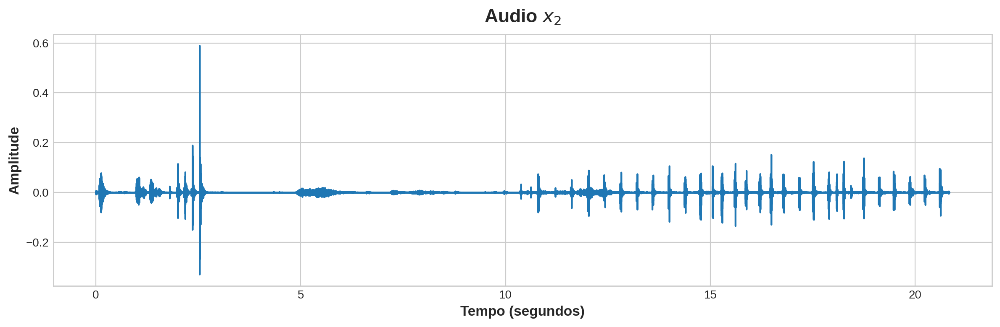

In [46]:
# Criando o vetor de tempo
N2 = len(x2)
n = np.arange(N2)
t = n / fs

# Plotagem do sinal de audio
plt.plot(t, x2)
plt.title(r'Audio $x_2$')
plt.xlabel('Tempo (segundos)')
plt.ylabel('Amplitude')
plt.show()

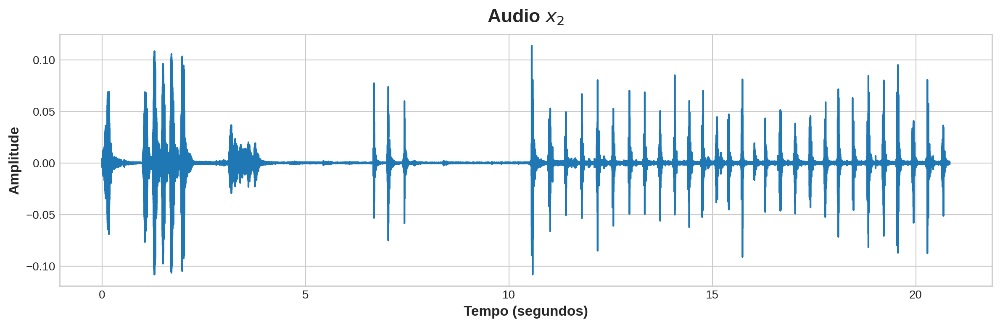

In [47]:
# Criando o vetor de tempo
N3 = len(x3)
n = np.arange(N3)
t = n / fs


# Plotagem do sinal de audio
plt.plot(t, x3)
plt.title(r'Audio $x_2$')
plt.xlabel('Tempo (segundos)')
plt.ylabel('Amplitude')
plt.show()

Como você pode ver, da metade para a frente parece que há uma ritmo bem constante.
Bom, isto é o Lucca pulando corda! Na primeira metade parece ter alguns ruidos, mas não precisamos nos preocupar (é o Lucca fazendo uns barulhos aleatórios para não ficar num silêncio rsrsrs).

Podemos também ouvir os áudios para entender ainda mais o contexto dos dados recebidos.

#### Audios

In [48]:
play(x1, fs)

In [49]:
play(x2, fs)

In [50]:
play(x3, fs)


#### *Desafio 1: (1 ponto)*
- Plote as ondas de som numa pequena janela de tempo, numa espécie de *zoom* para melhor visualizar elas.
- Experimente com tamanhos de janela diferentes.

*Dica*: Defina como parâmetros uma posição inicial no áudio original e um tamanho de janela.

## Análise exploratória

Nesta sessão, vamos investigar um pouco como uma pequena janela de tempo comporta no domínio do tempo comparado com o domínio da frequência. Mas antes disso, vamos analisar as ondas de som no áudio original.


>>>> **O que importa nesse momento é entender como é a onda da corda, pois é ela que será claissifcada como 1, ou seja, tudo que for diferente desse padrão será considerado como 0. Para isso, vamos analisar mais de perto da metade pra frente dos audios.**

In [51]:
!pip install pydub
from pydub import AudioSegment

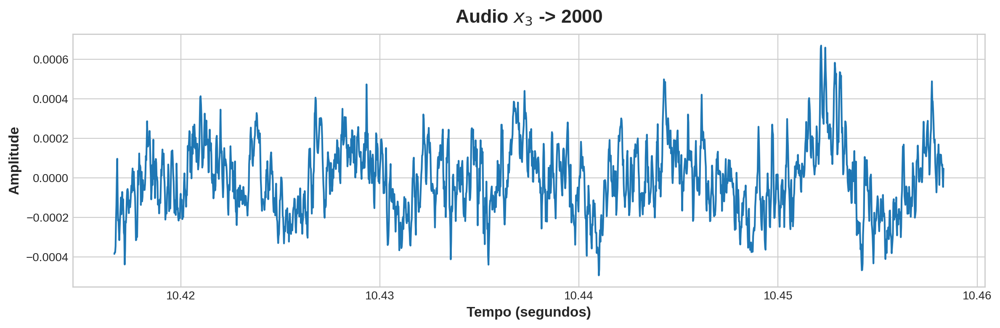

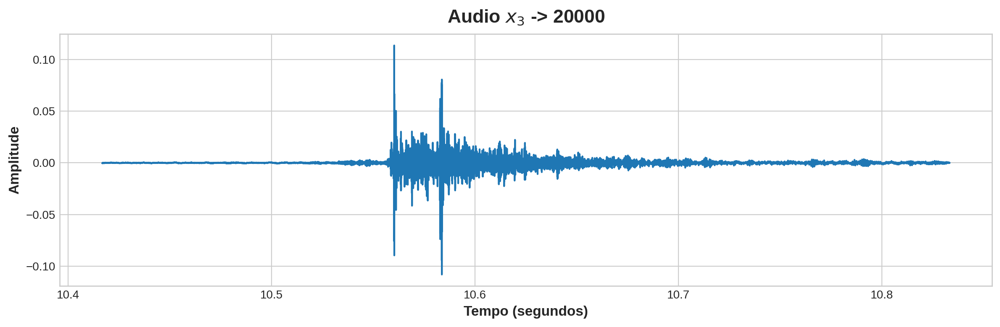

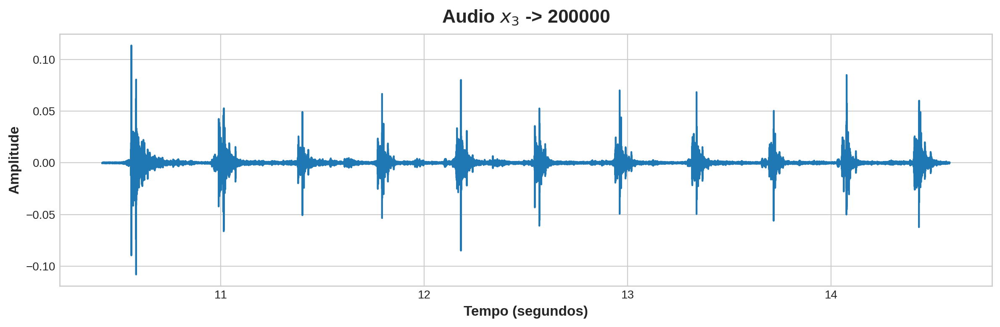

In [52]:
# Criando o vetor de tempo

t_aux = t[500000:999999] #metade para frente
x3_aux = x3[500000:999999] #metade para frente


# Plotagem do sinal de audio

# 2000 primeiras amostras
plt.plot(t_aux[0:2000],x3_aux[0:2000])
plt.title(r'Audio $x_3$ -> 2000')
plt.xlabel('Tempo (segundos)')
plt.ylabel('Amplitude')
plt.show()

# 20000 primeiras amostras
plt.plot(t_aux[0:20000],x3_aux[0:20000])
plt.title(r'Audio $x_3$ -> 20000')
plt.xlabel('Tempo (segundos)')
plt.ylabel('Amplitude')
plt.show()

# 200000 primeiras amostras
plt.plot(t_aux[0:200000],x3_aux[0:200000])
plt.title(r'Audio $x_3$ -> 200000')
plt.xlabel('Tempo (segundos)')
plt.ylabel('Amplitude')
plt.show()

>>>> **A janela de 2000 é a que mais se assemelha com o função seno, assim é mais fácil de vizualizar o padrão da frequencia do pulo, uma vez que, vamos utilizar fourier para procurar essas frequencias elementares e eliminar o que não for necessário**

### Domínio do Tempo VS Domínio da Frequência

O eixo $x$ da imagem que você plotou representa o tempo.
Porém, como vimos nas aulas, este não é o único modo de representar um sinal.
Ao invés de mostrar a intensidade do áudio ao longo do tempo, podemos mostrar as frequências que compoem o sinal original.
Deste modo, podemos analisar melhor a informação das características periódicas presentes no áudio em análise.



#### *Desafio 2: (1 ponto)*

1. Aplique a transformada de Fourier para visualizar as primeiras 200 amostras da magnitude do espectro.
2. O que você consegue interpretar a partir do gráfico da transformada? Ela apresenta algum destaque ou informação? O que os *picos* deste gráfico indicam?


In [53]:
metade = int(len(x3)/2)
print(metade)
#data = x3_aux[metade:metade+2000]#2000 amostras dps da metade
data = x3_aux[50000:50000+2000]
print(data)


500000
[ 0.00054686 -0.00036448 -0.00022673 ... -0.00021276 -0.00048663
 -0.00047584]


In [54]:
data_fft = np.fft.fft(data)

In [55]:
magnitude = np.abs(data_fft)
magnitude

array([0.00670577, 0.00913132, 0.01456571, ..., 0.0214149 , 0.01456571,
       0.00913132])

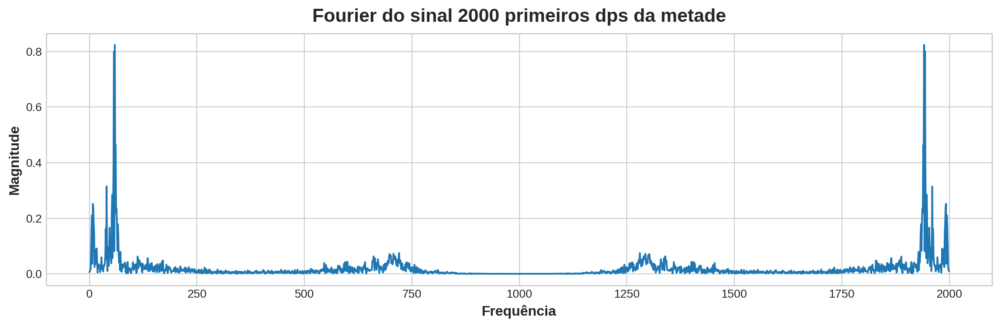

In [56]:
plt.title('Fourier do sinal 2000 primeiros dps da metade')
plt.xlabel('Frequência')
plt.ylabel('Magnitude')
plt.plot(magnitude[:2000])
plt.show()

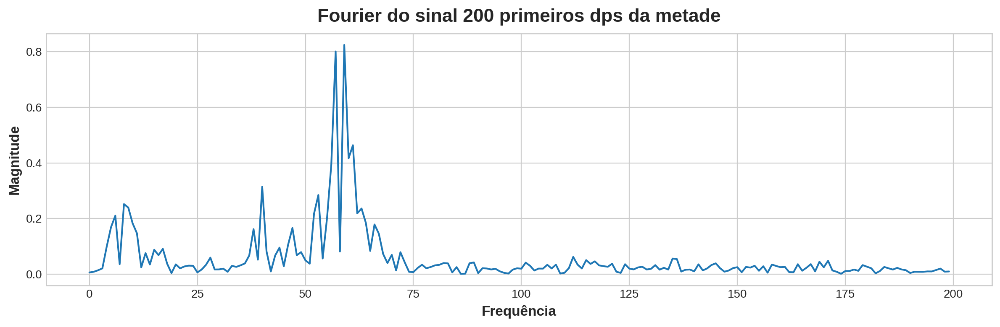

In [57]:
plt.title('Fourier do sinal 200 primeiros dps da metade')
plt.xlabel('Frequência')
plt.ylabel('Magnitude')
plt.plot(magnitude[:200])
plt.show()

>>>> **Tanto para os 200 primeiros quanto para os 2000 primeiros dados depois da metade do audio percebe-se alguns picos de magnitude muito importantes. Para os 2000 fica claro que há uma área de mais importânica logo no começo e uma área mais a frente que pode ou não significar um ruído.**

>>>> **Aproximando o gráfico para 200 amostras é mais nótavel algumas frequencias importantes que que são os picos circulados. A análise agora é trabalhar com esses picos, retirando e colocando de novo e vendo a influencia no áudio.**

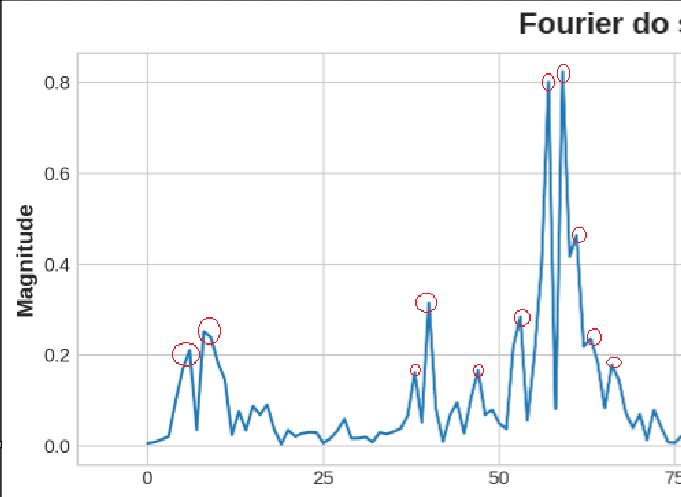

## Processamento dos dados

### Média móvel (filtro passa-baixo)

A média móvel é um **filtro de sinal** usado para suavizar dados. Ela se calcula com base na média de uma certa janela temporal (geralmente chamada de período) e movendo ou deslizando essa janela ao longo da toda uma série temporal.

O algoritmo de média móvel também é conhecido como **filtro passa-baixo** que, como o nome sugere, só deixa passar as frequências mais baixas de um sinal que, em outras palavras, equivale a eliminar o conteúdo de alta frequência!

In [58]:
def media_movel(signal, window_size):
    weights = np.repeat(1.0, window_size) / window_size
    moving_average = np.convolve(signal, weights, mode='same')

    return moving_average


#### *Desafio 3: (1 ponto)*
  
1. Pegue uma amostra do sinal dentro de uma janela de tempo e aplique a média movel.
Usando a função `plot_2_figures`, compare os sinais original e processado.
Experimente com tamanhos de janela diferentes.
2. Aplique a transformada de Fourier no sinal processado. Faça um gráfico comparando a magnitude dos espectros dos sinais original e processado.
3. Analisando ambos espectros, o que você consegue observar? Os sinais são parecidos? Por que?

*Dica*: Use uma janela de tamanho $2048$ na posição $3000$ do primeiro sinal $x_1$ para visualizar melhor o efeito da filtragem por média móvel (é apenas uma sugestão, você pode utilizar uma outra janela)

In [59]:
N3 = len(x1)
n = np.arange(N3)
t = n / fs

signal = x1[3000:5048]
novo_sinal = media_movel(signal, 100)

data_fft = np.fft.fft(signal)
data_fft_cortado = data_fft[0:200]
magnitude = np.abs(data_fft_cortado)

data_fft_novo = np.fft.fft(novo_sinal)
data_fft_cortado_novo = data_fft_novo[0:200]
magnitude_nova = np.abs(data_fft_cortado_novo)

kwargs = {
    'title1' : 'Original',
    'xlegend1' : r'eixo $x_1$',
    'ylegend1' : r'eixo $y_1$',
    'title2' : 'Processado',
    'xlegend2' : r'eixo $x_2$',
    'ylegend2' : r'eixo $y_2$',
}

kwargs2 = {
    'title1' : ' FFT Original',
    'xlegend1' : r'eixo $x_1$',
    'ylegend1' : r'eixo $y_1$',
    'title2' : 'FFT Processado',
    'xlegend2' : r'eixo $x_2$',
    'ylegend2' : r'eixo $y_2$',
}

plot_2_figures(signal, novo_sinal, **kwargs)
plot_2_figures(magnitude, magnitude_nova, **kwargs)

### Savitsky-Golay

O **filtro de Savitzky-Golay** é um outro algoritmo frequentemente utilizado em processamento de sinais e análise de séries temporais para suavização de dados e remoção de ruído em conjuntos de dados experimentais.
Ele funciona aplicando uma janela deslizante sobre os dados (semelhante ao filtro de média móvel), e ajustando um polinômio sobre os dados dentro da janela.
Em seguida, calcula-se o valor de suavização a partir dos coeficientes do polinômio.
Isto ajuda a reduzir ruídos presentes nos dados, preservando as características essenciais do sinal original.
A principal vantagem deste filtro é a sua capacidade de preservar as características locais da curva, tornando-o útil em aplicações que requerem suavização sem comprometer detalhes importantes.

Segue aqui um exemplo de uso do filtro.

In [60]:
from scipy.signal import savgol_filter

# Seus dados de entrada
data_teste = [1.2, 1.8, 2.1, 3.4, 2.8, 3.9, 4.2, 4.8]

# Especificação dos parâmetros do filtro
window_length = 5  # Tamanho da janela
polyorder = 2      # Ordem do polinômio

# Aplicando o filtro Savitzky-Golay
smoothed_data = savgol_filter(data_teste, window_length, polyorder)



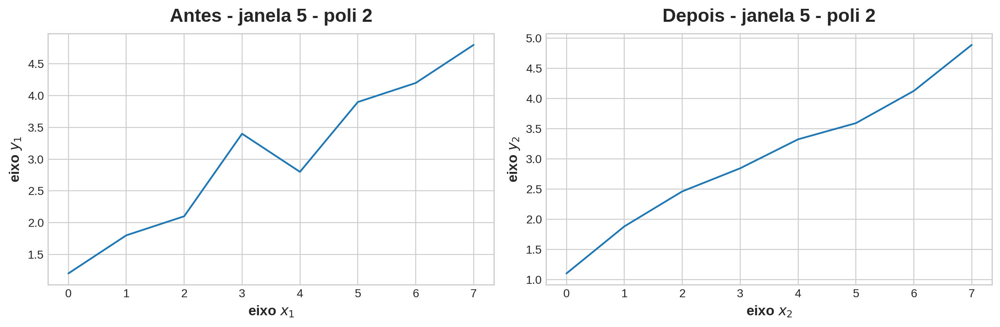

In [61]:
sinal1 = data_teste
sinal2 = smoothed_data

kwargs = {
    'title1': 'Antes - janela 5 - poli 2',
    'xlegend1': r'eixo $x_1$',
    'ylegend1': r'eixo $y_1$',
    'title2': 'Depois - janela 5 - poli 2',
    'xlegend2': r'eixo $x_2$',
    'ylegend2': r'eixo $y_2$'
}

plot_2_figures(sinal1, sinal2, **kwargs)

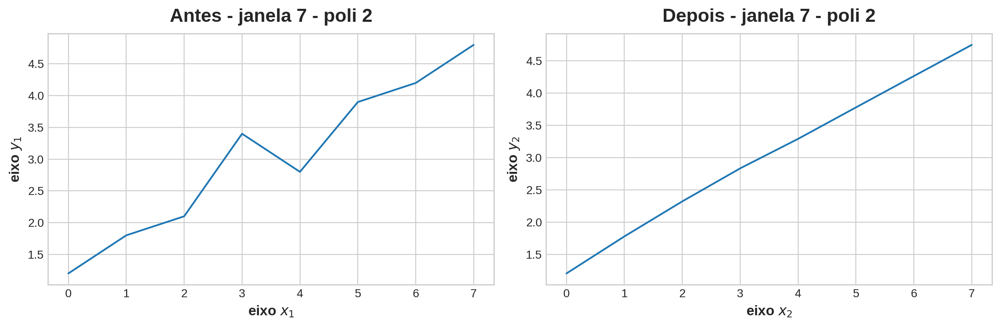

In [62]:
# Especificação dos parâmetros do filtro
window_length = 7  # Tamanho da janela
polyorder = 2      # Ordem do polinômio

# Aplicando o filtro Savitzky-Golay
smoothed_data = savgol_filter(data_teste, window_length, polyorder)

sinal1 = data_teste
sinal2 = smoothed_data

kwargs = {
    'title1': 'Antes - janela 7 - poli 2',
    'xlegend1': r'eixo $x_1$',
    'ylegend1': r'eixo $y_1$',
    'title2': 'Depois - janela 7 - poli 2',
    'xlegend2': r'eixo $x_2$',
    'ylegend2': r'eixo $y_2$'
}

plot_2_figures(sinal1, sinal2, **kwargs)

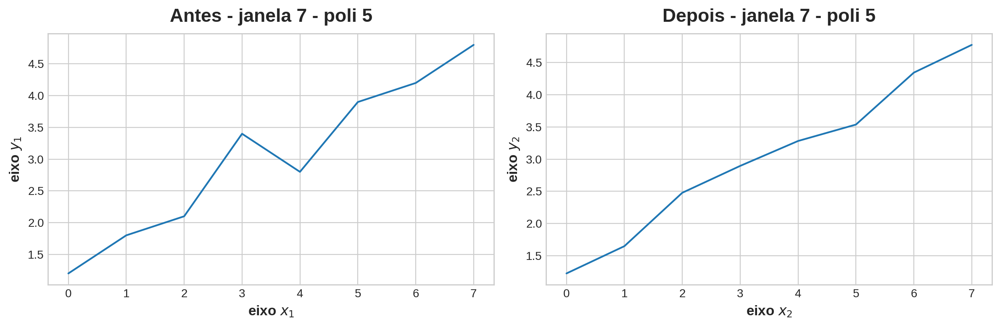

In [63]:
# Especificação dos parâmetros do filtro
window_length = 7  # Tamanho da janela
polyorder = 5      # Ordem do polinômio

# Aplicando o filtro Savitzky-Golay
smoothed_data = savgol_filter(data_teste, window_length, polyorder)

sinal1 = data_teste
sinal2 = smoothed_data

kwargs = {
    'title1': 'Antes - janela 7 - poli 5',
    'xlegend1': r'eixo $x_1$',
    'ylegend1': r'eixo $y_1$',
    'title2': 'Depois - janela 7 - poli 5',
    'xlegend2': r'eixo $x_2$',
    'ylegend2': r'eixo $y_2$'
}

plot_2_figures(sinal1, sinal2, **kwargs)

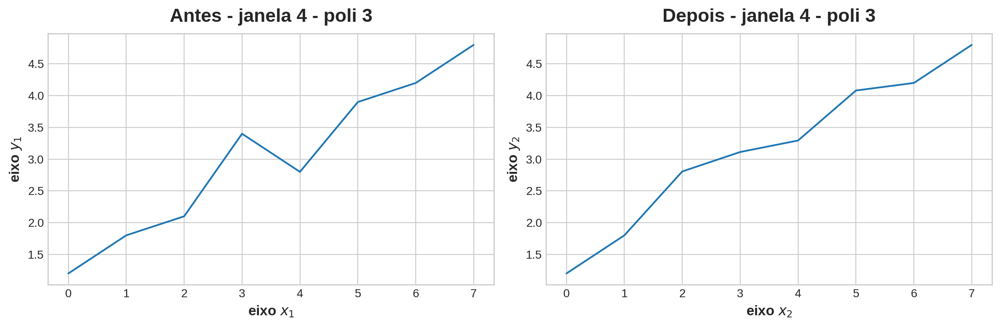

In [64]:
# Especificação dos parâmetros do filtro
window_length = 4  # Tamanho da janela
polyorder = 3      # Ordem do polinômio

# Aplicando o filtro Savitzky-Golay
smoothed_data = savgol_filter(data_teste, window_length, polyorder)

sinal1 = data_teste
sinal2 = smoothed_data

kwargs = {
    'title1': 'Antes - janela 4 - poli 3',
    'xlegend1': r'eixo $x_1$',
    'ylegend1': r'eixo $y_1$',
    'title2': 'Depois - janela 4 - poli 3',
    'xlegend2': r'eixo $x_2$',
    'ylegend2': r'eixo $y_2$'
}

plot_2_figures(sinal1, sinal2, **kwargs)

>>>> **Aqui eu estava apenas brincando com os dados de teste para entender a suavização.**


#### *Desafio 4: (1 ponto)*

1. Escolha uma janela de tempo e aplique o filtro de Savitzky-Golay.
Usando a função `plot_2_figures`, compare o sinal original da janela com o sinal processado. Teste com diferentes parâmetros do filtro.
2. No sinal processado, aplique a transformada de Fourier e faça um gráfico comparativo mostrando a magnitude do espectro dos sinais original e processado.
3. Analisando ambos espectros, o que você consegue observar? Os sinais são parecidos? Por que?

**Para 3000 amostras**

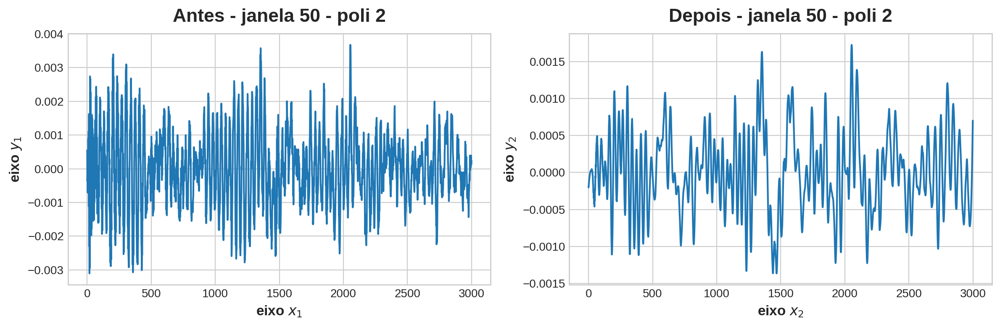

In [65]:
data = x3_aux[50000:50000+3000] #janela de 3000 amostras

# Parametros para o snmooth do audio original
window_length = 50  # Tamanho da janela
polyorder = 2     # Ordem do polinômio

# filtro Savitzky-Golay
smoothed_data_audio = savgol_filter(data, window_length, polyorder)

sinal1 = data
sinal2 = smoothed_data_audio

kwargs = {
    'title1': 'Antes - janela 50 - poli 2',
    'xlegend1': r'eixo $x_1$',
    'ylegend1': r'eixo $y_1$',
    'title2': 'Depois - janela 50 - poli 2',
    'xlegend2': r'eixo $x_2$',
    'ylegend2': r'eixo $y_2$'
}

plot_2_figures(sinal1, sinal2, **kwargs)

>>>> **Muitas amostras dificultam enxergar a suaviação, vamos reduzir**

**Para 1000 amostras**

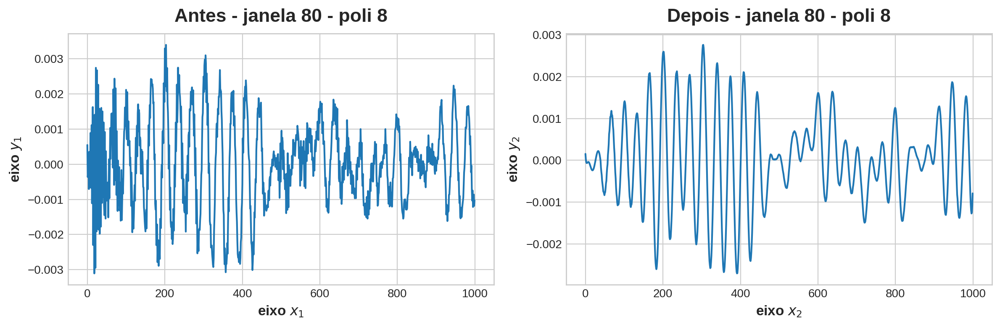

In [66]:
data = x3_aux[50000:50000+1000] #janela de 1000 amostras



# Parametros para o snmooth do audio original
window_length = 80  # Tamanho da janela
polyorder = 8    # Ordem do polinômio

# filtro Savitzky-Golay
smoothed_data_audio = savgol_filter(data, window_length, polyorder)

sinal1 = data
sinal2 = smoothed_data_audio

kwargs = {
    'title1': 'Antes - janela 80 - poli 8',
    'xlegend1': r'eixo $x_1$',
    'ylegend1': r'eixo $y_1$',
    'title2': 'Depois - janela 80 - poli 8',
    'xlegend2': r'eixo $x_2$',
    'ylegend2': r'eixo $y_2$'
}

plot_2_figures(sinal1, sinal2, **kwargs)

>>>> **Muito mais visivel, porém é válido aproximar mais ainda.**


**Para 100 amostras**

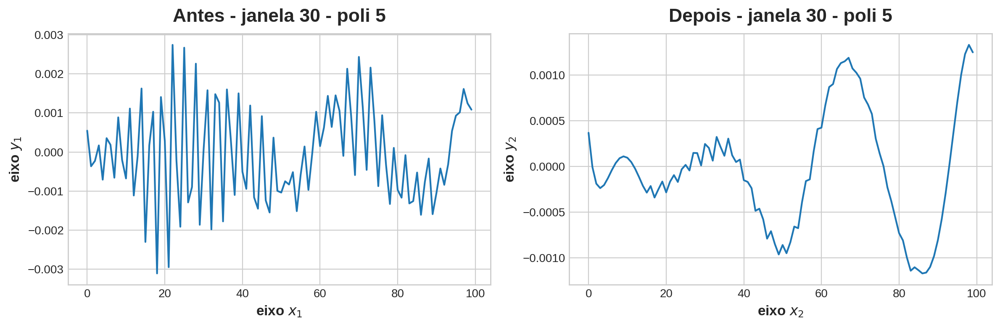

In [67]:
data = x3_aux[50000:50000+100] #janela de 100 amostras



# Parametros para o snmooth do audio original
window_length = 30  # Tamanho da janela
polyorder = 5    # Ordem do polinômio

# filtro Savitzky-Golay
smoothed_data_audio = savgol_filter(data, window_length, polyorder)

sinal1 = data
sinal2 = smoothed_data_audio

kwargs = {
    'title1': 'Antes - janela 30 - poli 5',
    'xlegend1': r'eixo $x_1$',
    'ylegend1': r'eixo $y_1$',
    'title2': 'Depois - janela 30 - poli 5',
    'xlegend2': r'eixo $x_2$',
    'ylegend2': r'eixo $y_2$'
}

plot_2_figures(sinal1, sinal2, **kwargs)

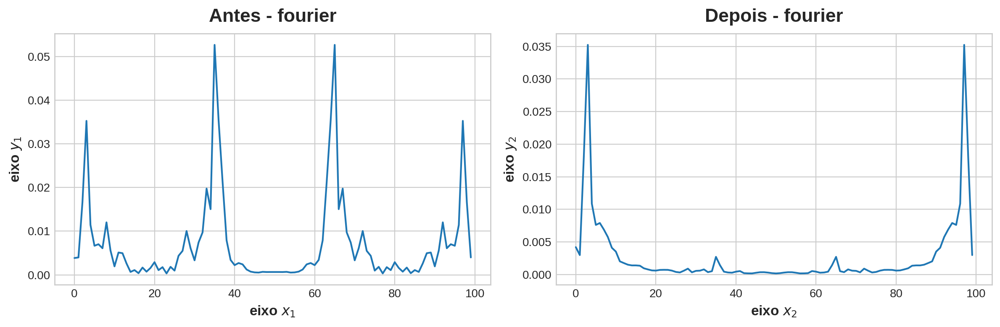

In [68]:
signal_fft_processado = np.fft.fft(smoothed_data_audio)
signal_fft_original = np.fft.fft(data)

magnitude_processado = np.abs(signal_fft_processado)
magnitude_original = np.abs(signal_fft_original)


sinal1 = magnitude_original
sinal2 = magnitude_processado

kwargs = {
    'title1': 'Antes - fourier',
    'xlegend1': r'eixo $x_1$',
    'ylegend1': r'eixo $y_1$',
    'title2': 'Depois - fourier',
    'xlegend2': r'eixo $x_2$',
    'ylegend2': r'eixo $y_2$'
}

plot_2_figures(sinal1, sinal2, **kwargs)

>>>> **Sim, os sinais são muito parecidos, porém com valores de aplitude diferentes. Isso é justamente causado pela suavização do filtro de Savitzky-Golay. Como podemos ver nos gráficos acima, temos 2 picos principais onsiderando apenas no eixo x de 0 a 50. Fica evidente que o filtro reduziu em muito a magnitude do pico mais alto e manteve o valor do pico mais baixo.**

>>>> **E o que isso significa? Bom, o filtro realmente cumpre com sua função reduzindo os picos maiores que muitas vezes podem ser ruídos no meu audio. Cabe ao analista saber se são ou não ruído e aplicar o filtro para a retirada dessas "frequencias", assim o audio ficará mais limpo**

## Modelo

Agora é sua vez. Lembre-se, a nota da sua prova será igual à acurácia do seu modelo.........brincadeira 🙃.
O objetivo aqui é juntar seus conhecimentos Python em processamento de sinais para criar um modelo de classificação de áudio.

***Apenas relembrando**: O objetivo é *"para uma dada janela de tempo no áudio, podemos dizer se há alguém pulando a corda?"*

### *Desafio 5: (6 pontos)*

Utilize o que você aprendeu e aplicou neste notebook para montar um modelo de classificação de aúdio. Para isto:
1. Monte um dataset com janelas de tempo de tamanho fixo e label binária ($1$ para *"está pulando"* e $0$ para *"não está pulando"*).
Utilize os 3 arquivos de sinais recebidos. (2 pontos)
2. Processe o dataset com técnicas de sua escolha. (2 pontos)
3. Crie um modelo classificador. A definição do modelo fica ao seu critério (*e.g.*, regressão logística, rede neural, arvore de decisão, etc.) (1 ponto)
4. Avalie seu modelo em termos de Acurácia, Precisão, Recall e F1-Score. Interprete os resultados (1 ponto)

####**Montar o dataset Dos valores originais**

In [69]:
import pandas as pd

In [70]:
df_teste = pd.DataFrame(x1, columns=['Valores'])
#df.append(x2)
print(df_teste)

         Valores
0       0.002230
1       0.003495
2       0.003006
3       0.000965
4      -0.001442
...          ...
999995  0.000612
999996  0.003264
999997 -0.003622
999998 -0.000538
999999  0.002779

[1000000 rows x 1 columns]


In [71]:
import pandas as pd

# criar um DataFrame
def create_dataframe_from_array(audio):
    metade = len(audio) // 2
    # metade pra baixo é 0 (np.zeros) metade para frente é 1 (np.ones)
    targets = np.concatenate((np.zeros(metade, dtype=int), np.ones(len(audio) - metade, dtype=int)))
    # cria o DataFrame do audio
    return pd.DataFrame({'Valores': audio, 'Target': targets})

# cria para cada um deles
df1 = create_dataframe_from_array(x1)
df2 = create_dataframe_from_array(x2)
df3 = create_dataframe_from_array(x3)

# concatena todos
final_df = pd.concat([df1, df2, df3], ignore_index=True)

print(final_df)



          Valores  Target
0        0.002230       0
1        0.003495       0
2        0.003006       0
3        0.000965       0
4       -0.001442       0
...           ...     ...
2999995 -0.000027       1
2999996  0.000024       1
2999997 -0.000177       1
2999998 -0.000330       1
2999999 -0.000279       1

[3000000 rows x 2 columns]


In [72]:
print(final_df['Target'].sum()) #conferindo quantos valore positivos eu tenho

1500000


In [73]:
#embaralhar o dataset
df_final = final_df.sample(frac=1).reset_index(drop=True)

print(df_final.head(20))


         Valores  Target
0  -2.464466e-04       0
1   4.542447e-04       1
2  -1.090112e-02       0
3   1.375435e-03       1
4   2.037802e-03       1
5  -8.195385e-05       0
6   5.011614e-04       1
7  -5.770546e-04       1
8  -5.285219e-04       0
9  -6.986160e-03       1
10  6.654202e-04       1
11 -6.677005e-07       0
12 -8.210187e-05       1
13  8.475307e-07       1
14 -3.517685e-04       1
15 -5.978664e-04       0
16 -5.650024e-05       0
17  1.798691e-02       0
18  3.634582e-04       1
19 -2.188057e-04       1


**Notas importantes:**
- Para a montagem do dataset, lembrem que há várias técnicas de amostragem de dados. Como vocês devem selecionar janelas de tempo dos áudios para criar um dataset, pensem em como coletar essas janelas. Serão janelas aleatórias? Serão janelas igualmente espaçadas? Algumas técnicas que aprendemos em estatística são amostragem simples, estratificada, sistemática e etc. (Não precisa detalhar qual método vocês vão utilizar, apenas pensem em como montar um bom dataset que represente os áudios)

- Não pegue janelas de tempo muito grandes (recomendo janelas com menos de 0.1 segundo). Caso a janela seja grande, na hora de montar o dataset pode haver muita sobreposição de dados (parte de uma janela está em outra janela do dataset) e isso pode levar em overfitting.

**Ajudinha**

Como lembrar de sintaxe pode ser meio difícil (todo mundo usa a chat para essas coisas hoje em dia) aqui está alguns exemplos de códigos que podem auxiliar vocês:

- Criar modelo

In [74]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression

LogisticRegression

In [75]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score,mean_squared_error

# X e Y
X = df_final[['Valores']]
y = df_final['Target']

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Instanciar e treinar o modelo de regressão linear
model = LogisticRegression()
model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# Avaliar o modelo
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
accuracy  = accuracy_score(y_test, y_pred)
f1        = f1_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall    = recall_score(y_test, y_pred)

print('Regressão Logistica')
print(f'R2: {rmse:3f}')
print('*'*10)
print(f'Acuracia: {accuracy:3f}')
print('*'*10)
print(f'f1_score: {f1:3f}')
print('*'*10)
print(f'Precisão: {precision:3f}')
print('*'*10)
print(f'Recall: {recall:3f}')



Regressão Logistica
R2: 0.707282
**********
Acuracia: 0.499752
**********
f1_score: 0.000000
**********
Precisão: 0.000000
**********
Recall: 0.000000


DecisionTreeClassifier

In [76]:
# Instanciar e treinar o modelo de regressão linear
model = DecisionTreeClassifier()
model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# Avaliar o modelo
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
accuracy  = accuracy_score(y_test, y_pred)
f1        = f1_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall    = recall_score(y_test, y_pred)

print('DecisionTreeClassifier')
print(f'R2: {rmse:3f}')
print('*'*10)
print(f'Acuracia: {accuracy:3f}')
print('*'*10)
print(f'f1_score: {f1:3f}')
print('*'*10)
print(f'Precisão: {precision:3f}')
print('*'*10)
print(f'Recall: {recall:3f}')

DecisionTreeClassifier
R2: 0.697652
**********
Acuracia: 0.513282
**********
f1_score: 0.660901
**********
Precisão: 0.507235
**********
Recall: 0.948139


RandomForestClassifier

In [77]:
# Instanciar e treinar o modelo de regressão linear
model = RandomForestClassifier()
model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# Avaliar o modelo
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
accuracy  = accuracy_score(y_test, y_pred)
f1        = f1_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall    = recall_score(y_test, y_pred)

print('RandomForestClassifier')
print(f'R2: {rmse:3f}')
print('*'*10)
print(f'Acuracia: {accuracy:3f}')
print('*'*10)
print(f'f1_score: {f1:3f}')
print('*'*10)
print(f'Precisão: {precision:3f}')
print('*'*10)
print(f'Recall: {recall:3f}')

KeyboardInterrupt: ignored

XGBClassifier

In [ ]:
# Instanciar e treinar o modelo de regressão linear
model = XGBClassifier()
model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# Avaliar o modelo
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
accuracy  = accuracy_score(y_test, y_pred)
f1        = f1_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall    = recall_score(y_test, y_pred)

print('XGBClassifier')
print(f'R2: {rmse:3f}')
print('*'*10)
print(f'Acuracia: {accuracy:3f}')
print('*'*10)
print(f'f1_score: {f1:3f}')
print('*'*10)
print(f'Precisão: {precision:3f}')
print('*'*10)
print(f'Recall: {recall:3f}')

####**Montar o dataset Dos valores processados em FOURIER**

In [79]:
signal_fft_x1 = np.fft.fft(x1)
signal_fft_x2 = np.fft.fft(x2)
signal_fft_x3 = np.fft.fft(x3)

signal_fft_x1 = np.abs(signal_fft_x1)
signal_fft_x2 = np.abs(signal_fft_x2)
signal_fft_x3 = np.abs(signal_fft_x3)

In [81]:
# cria para cada um deles
df1 = create_dataframe_from_array(signal_fft_x1)
df2 = create_dataframe_from_array(signal_fft_x2)
df3 = create_dataframe_from_array(signal_fft_x3)

# concatena todos
final_df_fourier = pd.concat([df1, df2, df3], ignore_index=True)

print(final_df_fourier)

          Valores  Target
0        0.127854       0
1        0.211431       0
2        0.071155       0
3        0.247654       0
4        0.200461       0
...           ...     ...
2999995  0.101013       1
2999996  0.077542       1
2999997  0.094325       1
2999998  0.075588       1
2999999  0.113723       1

[3000000 rows x 2 columns]


LogisticRegression

In [ ]:
# X e Y
X = final_df_fourier[['Valores']]
y = final_df_fourier['Target']

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Instanciar e treinar o modelo de regressão linear
model = LogisticRegression()
model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# Avaliar o modelo
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
accuracy  = accuracy_score(y_test, y_pred)
f1        = f1_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall    = recall_score(y_test, y_pred)

print('Regressão Logistica')
print(f'R2: {rmse:3f}')
print('*'*10)
print(f'Acuracia: {accuracy:3f}')
print('*'*10)
print(f'f1_score: {f1:3f}')
print('*'*10)
print(f'Precisão: {precision:3f}')
print('*'*10)
print(f'Recall: {recall:3f}')

DecisionTreeClassifier

In [ ]:
# Instanciar e treinar o modelo de regressão linear
model = DecisionTreeClassifier()
model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# Avaliar o modelo
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
accuracy  = accuracy_score(y_test, y_pred)
f1        = f1_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall    = recall_score(y_test, y_pred)

print('DecisionTreeClassifier')
print(f'R2: {rmse:3f}')
print('*'*10)
print(f'Acuracia: {accuracy:3f}')
print('*'*10)
print(f'f1_score: {f1:3f}')
print('*'*10)
print(f'Precisão: {precision:3f}')
print('*'*10)
print(f'Recall: {recall:3f}')

RandomForestClassifier

In [ ]:
# Instanciar e treinar o modelo de regressão linear
model = RandomForestClassifier()
model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# Avaliar o modelo
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
accuracy  = accuracy_score(y_test, y_pred)
f1        = f1_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall    = recall_score(y_test, y_pred)

print('RandomForestClassifier')
print(f'R2: {rmse:3f}')
print('*'*10)
print(f'Acuracia: {accuracy:3f}')
print('*'*10)
print(f'f1_score: {f1:3f}')
print('*'*10)
print(f'Precisão: {precision:3f}')
print('*'*10)
print(f'Recall: {recall:3f}')

XGBClassifier

In [ ]:
# Instanciar e treinar o modelo de regressão linear
model = XGBClassifier()
model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# Avaliar o modelo
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
accuracy  = accuracy_score(y_test, y_pred)
f1        = f1_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall    = recall_score(y_test, y_pred)

print('XGBClassifier')
print(f'R2: {rmse:3f}')
print('*'*10)
print(f'Acuracia: {accuracy:3f}')
print('*'*10)
print(f'f1_score: {f1:3f}')
print('*'*10)
print(f'Precisão: {precision:3f}')
print('*'*10)
print(f'Recall: {recall:3f}')